In [78]:
import requests
import networkx
import time
import collections
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import scipy as sp
import seaborn as sns
import scipy.spatial as spt
import igraph
# from main import *
# from vk_token import *
from functions_for_vk_users import *
from functions_for_vk_groups import *

In [2]:
%matplotlib inline

In [3]:
sns.set(style="whitegrid", color_codes=True)

## 1. Data Mining Lab's group network summary

### 1.1. Network source and preprocessing

Source of my network is **VK** you can see full realization of getting this graph from vk in **data_mining_labs_graph.ipynb** + **function_for_vk_groups.py**

In [18]:
g = nx.read_gml('dml.gml')

### 1.2. Node degree graph

In [5]:
# g = drop_users(g)

In [6]:
node_degree = nx.degree(g)

In [7]:
np.mean(list(node_degree.values()))

6.2362139917695476

In [8]:
get_basic_information(g)

'Data Mining Labs' network has 2430 active members with 7577 connections between each other.
Number of connected components = 754


In [14]:
core_g = drop_lonely_users(g, 5)

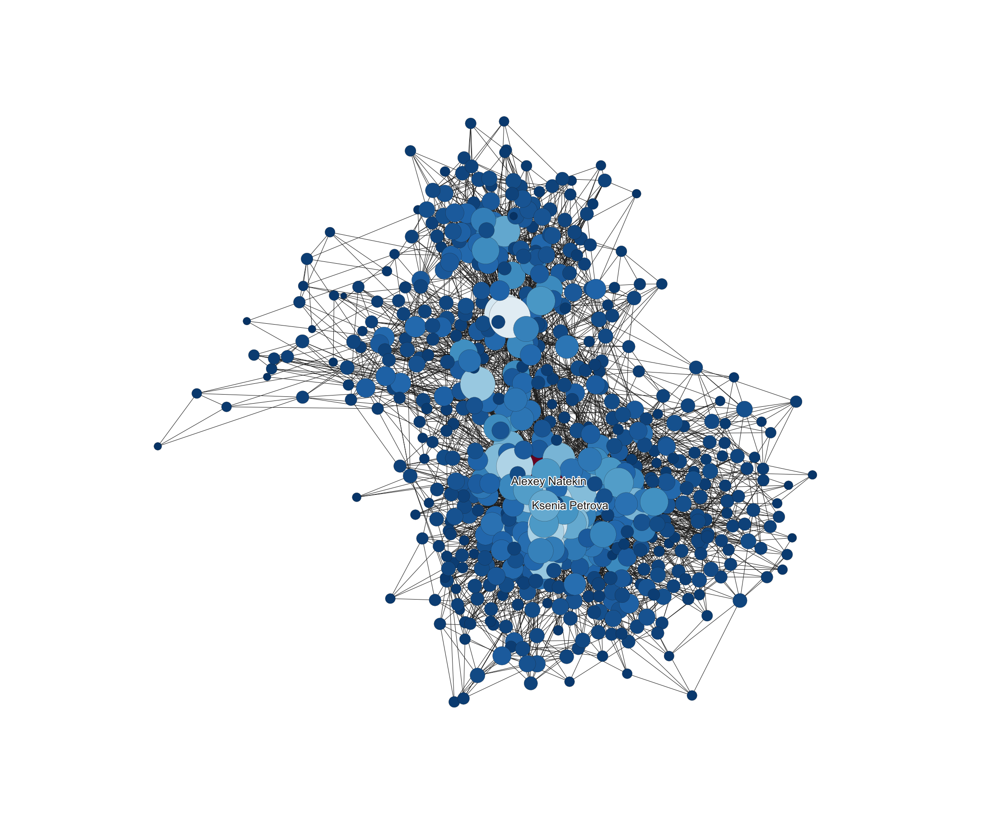

In [16]:
draw_graph(core_g, core_g.degree(), 100, 2)

### 1.3. Degree distribution 

In [20]:
g = nx.read_gml('dml.gml')

In [19]:
get_nodes_degree(g)

Max value of node degree = 244
Mean value of node degree = 6.236213991769548


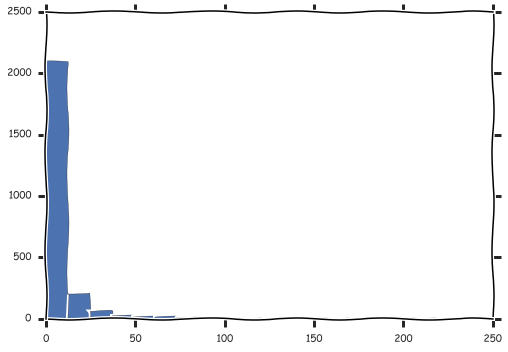

In [21]:
degree_sequence = sorted(nx.degree(g).values(), reverse=True)
plt.hist(degree_sequence, bins = 20, facecolor='b')
plt.show()

In [22]:
print(len([n for n in node_degree if node_degree[n] == 0]), 'people with no friends in Data Mining Labs community')

714 people with no friends in Data Mining Labs community


### 1.4. Diameter

In [30]:
g = drop_lonely_users(g, 0)

In [31]:
nx.diameter(core_g)

6

### 1.5. Clustering coefficient for nodes

In [35]:
clustering = nx.clustering(core_g, nodes=None, weight=None)

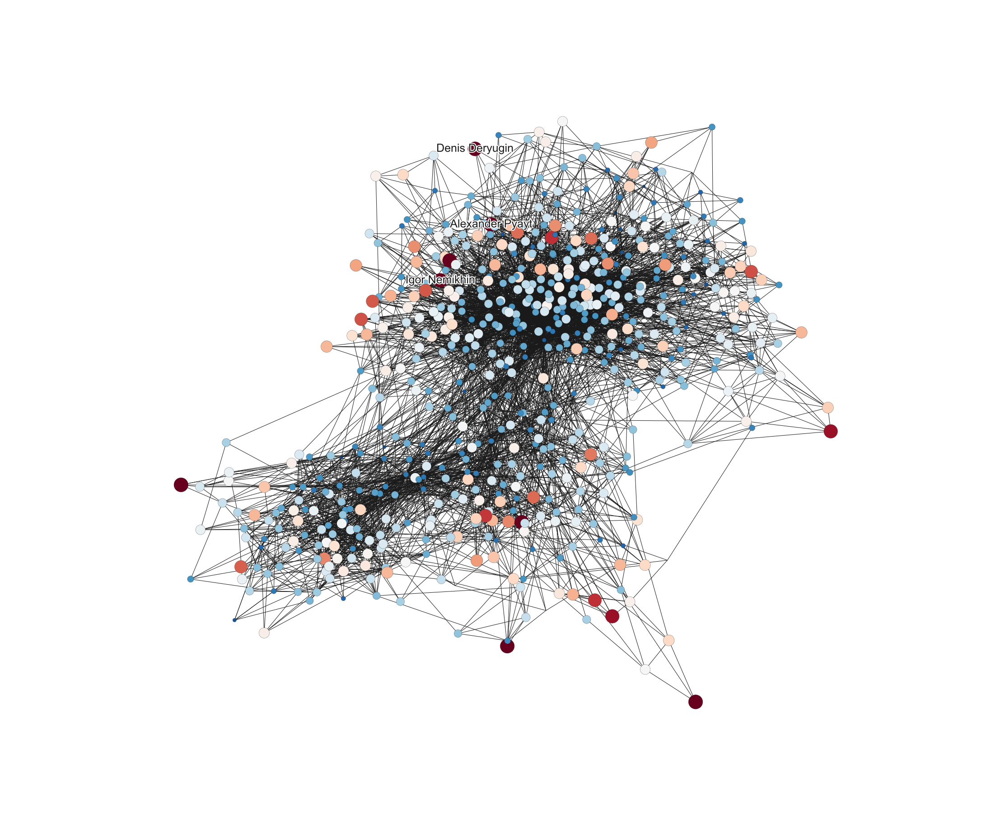

In [36]:
draw_graph(core_g, clustering, 1000, 3)

In [37]:
nx.triangles(g)

{9334784: 76,
 57921536: 49,
 5873666: 0,
 4759558: 1,
 2383880: 1,
 121761801: 0,
 96268302: 2,
 63239641: 1,
 2736147: 0,
 19324949: 7,
 126998: 0,
 53674007: 0,
 269570072: 49,
 12840985: 0,
 19959834: 0,
 1204255: 0,
 36: 99,
 37: 44,
 4136: 37,
 19394602: 5,
 12349486: 1,
 12660744: 100,
 55: 3,
 17642164: 0,
 13594682: 1,
 236160785: 0,
 11963152: 0,
 438335: 0,
 215990337: 6,
 3842116: 1,
 18559047: 0,
 1699912: 52,
 6342668: 3,
 3453005: 0,
 1146964: 2,
 137801815: 11,
 499800: 0,
 1658969: 0,
 2744410: 6,
 75791: 29,
 86151260: 0,
 90669149: 0,
 348319838: 0,
 483424: 43,
 151121: 0,
 20160614: 1,
 25182311: 18,
 49033916: 1,
 81637486: 44,
 5623920: 155,
 14545009: 50,
 12361844: 0,
 169496702: 31,
 180353: 38,
 8044674: 34,
 4784259: 30,
 753796: 11,
 1679382: 11,
 41095: 3,
 6578312: 0,
 1589386: 1,
 9744525: 12,
 2803053: 10,
 3588241: 1,
 11780243: 0,
 5752857: 1,
 270488: 269,
 8346: 13,
 9154716: 4,
 327838: 0,
 349376672: 0,
 2195627: 3,
 14008497: 2,
 58171570: 0,
 21

### 1.6. Graph transitivity, the fraction of all possible triangles present in *g*

In [38]:
nx.transitivity(g)

0.20374784252486233

### 1.7. Average clustering

In [39]:
nx.average_clustering(g)

0.22500311831494382

## 2. Structural analysis

### 2.1. Compute the degree centrality for nodes.

In [41]:
degree_centrality = networkx.degree_centrality(core_g)

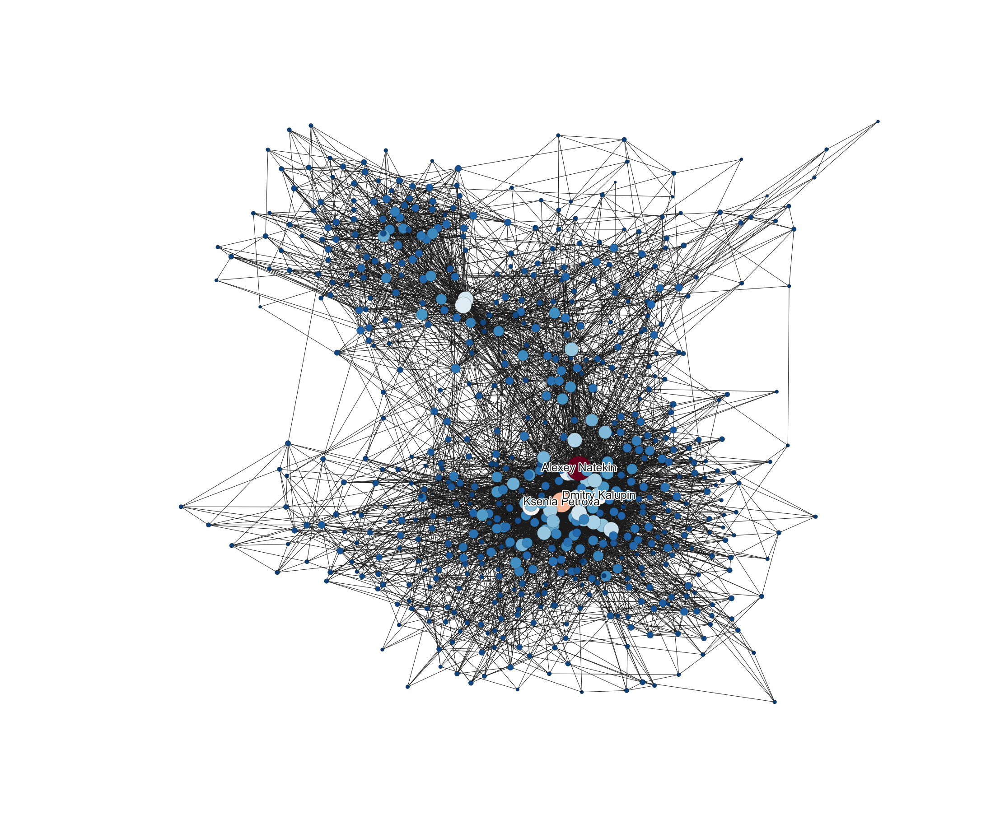

In [44]:
draw_graph(core_g, degree_centrality, 10000, 3)

### 2.1. Compute closeness centrality for nodes.

In [46]:
closeness_centrality = networkx.closeness_centrality(core_g)

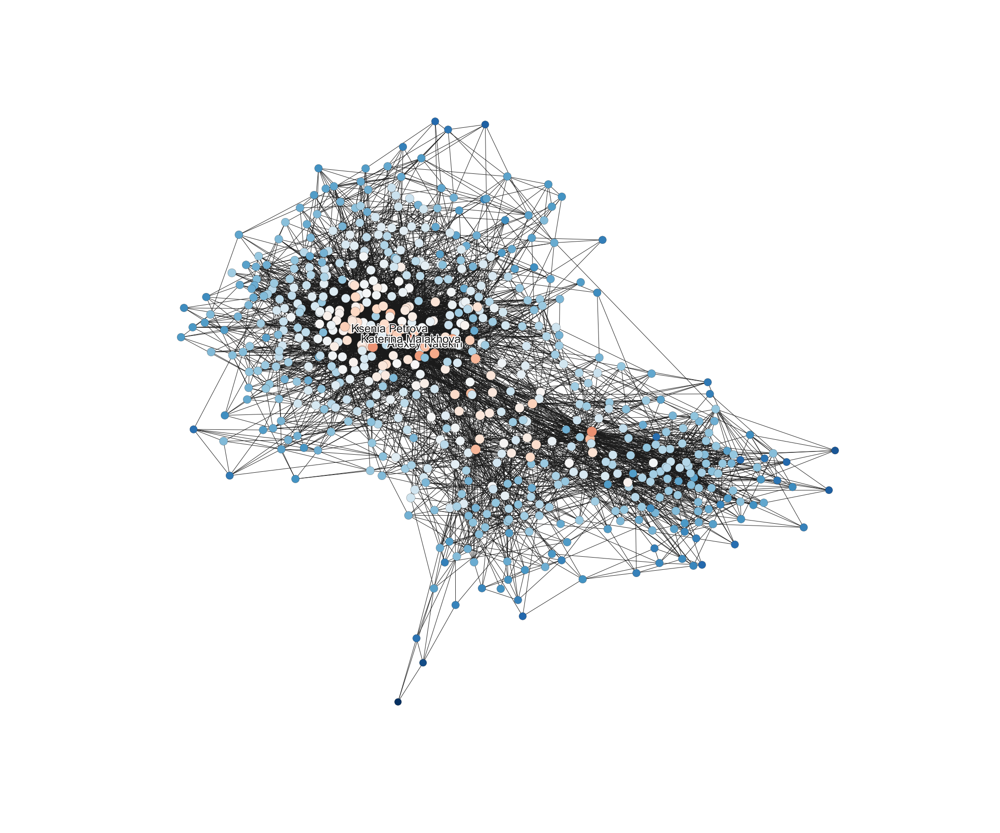

In [48]:
draw_graph(core_g, closeness_centrality, 1000, 3)

### 2.1. Compute the shortest-path betweenness centrality for nodes

In [51]:
betweenness_centrality = networkx.betweenness_centrality(core_g)

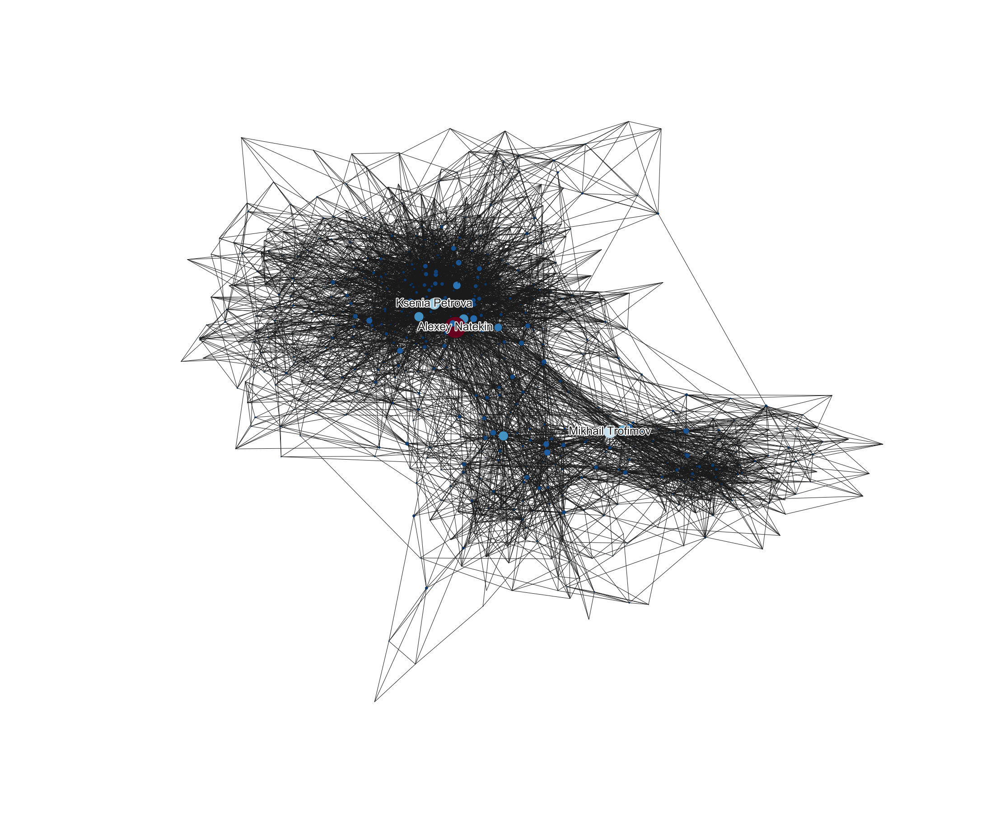

In [52]:
draw_graph(core_g, betweenness_centrality, 10000, 3)

### Interpretation 

We see here huge community with small amount of main members, looks like we have introverts group

### 2.2. Page-Rank

In [54]:
pagerank = networkx.pagerank(core_g, alpha=0.85)

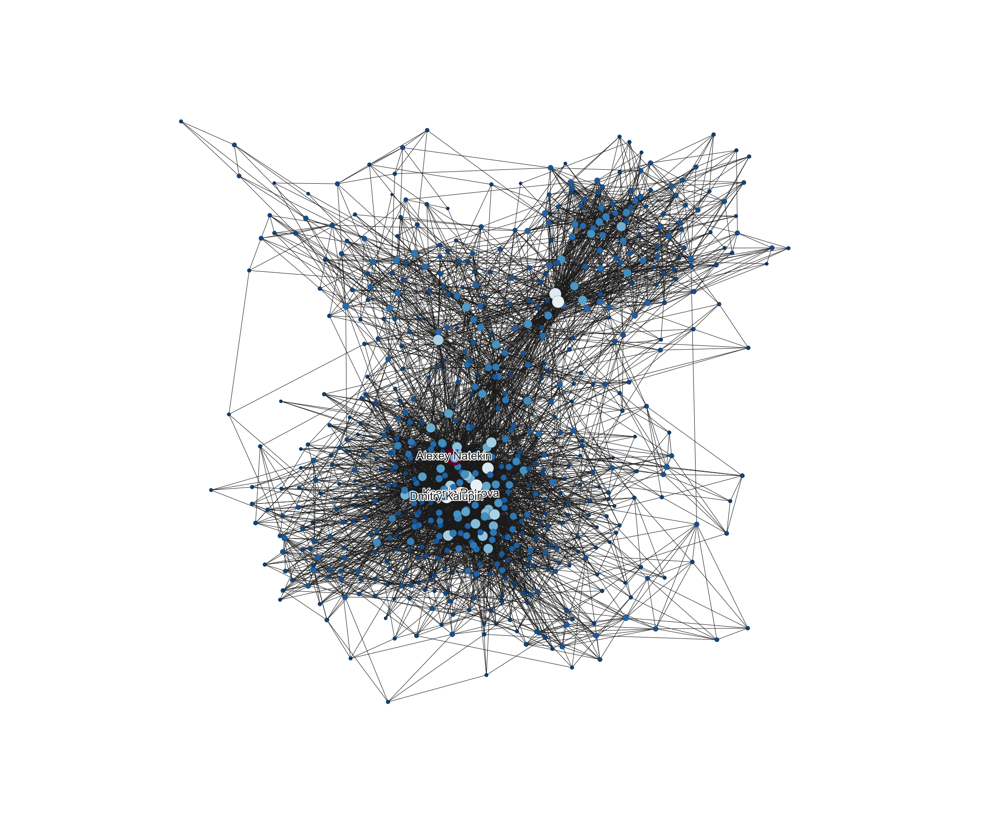

In [55]:
draw_graph(core_g, pagerank, 100000, 3)

Same group of people has large page-ranks

### 2.3. Assortativity mixing

Assortativity is a preference for a network's nodes to attach to others that are similar in some way. When r = 1, the network is said to have perfect assortative mixing patterns, when r = 0 the network is non-assortative, while at r = −1 the network is completely disassortative.

In [59]:
ag = nx.attribute_assortativity_coefficient(g,'gender')
ac = nx.attribute_assortativity_coefficient(g,'city')
au = nx.attribute_assortativity_coefficient(g,'university')
af = nx.attribute_assortativity_coefficient(g,'friends')

print('gender: ' + str(ag))
print('city: ' + str(ac))
print('university: ' + str(au))
print('friends: ' + str(af))

gender: 0.08119338799456931
city: 0.28831235032064817
university: 0.07779677416928377
friends: -0.0020489562772190418


Gender assortativity of our network is close to zero, which means that network is non-assortative and has no clear structure (smth between core with periphery and star).
City assortativity is also very small, the same with university and especially friends. 

### 2.4. Node structural equivalence/similarity

Similarity in network analysis occurs when two nodes fall in the same equivalence class. We will consider structural equivalence. Two nodes of a network are structurally equivalent if they share many of the same neighbors.

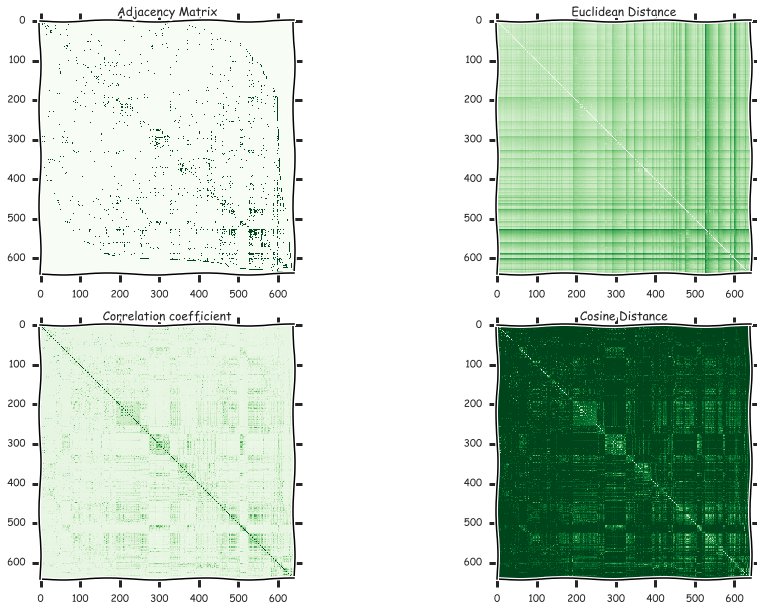

In [60]:
plot_similarity(get_sparse_matrix(core_g))

### 2.5. The closest random graph model similar to my SN

In [71]:
compare_graph(core_g)

Compare the number of edges
 
My network: 5251
Erdos: 5143
Barabasi: 5688
SW: 5128
Compare average clustering coefficients
 
My network: 0.3595464145571475
Erdos: 0.026350825921333122
Barabasi: 0.0788052256282249
SW: 0.6187162420891662
Compare average path length
 
My network: 2.830279836193448
Erdos: 2.6342872464898597
Barabasi: 2.4798020670826832
SW: 3.8100867784711387
Compare graph diameter
 
My network: 6
Erdos: 4
Barabasi: 4
SW: 7


#### looks like the closest graph is SW

## 3. Community Detection

### 3.1. Clique Search

In [ ]:
igraph_cliques(const igraph_t *graph, igraph_vector_ptr_t *res,
                   igraph_integer_t min_size, igraph_integer_t max_size);